In [1]:
import math
import numpy as np

import mido
import librosa
import librosa.display

import IPython.display as ipd
import matplotlib.pyplot as plt

In [2]:
y, sr = librosa.load('SlowAndCalm.wav')

In [3]:
D = librosa.stft(y)

In [4]:
D

array([[-1.8888131e+00+0.00000000e+00j, -2.7408571e+00+0.00000000e+00j,
         1.0473441e+00+0.00000000e+00j, ...,
         2.4939960e-01+0.00000000e+00j, -4.7475548e+00+0.00000000e+00j,
        -1.0813597e+01+0.00000000e+00j],
       [ 7.7347393e+00+3.50414142e-16j, -8.4254211e-01-3.14104772e+00j,
         1.0928090e+00+5.83967018e+00j, ...,
        -1.4070572e-01+5.64262383e-02j, -4.7175848e-01-5.08921480e+00j,
         1.0899426e+01-1.05640113e+00j],
       [-1.9618341e+01+2.41039827e-15j,  2.2489563e+01+1.28234444e+01j,
         2.4744351e+00-3.02650700e+01j, ...,
         3.2219291e-01-9.27704215e-01j,  4.5806131e+00-7.42716730e-01j,
        -1.0436050e+01+1.95642054e+00j],
       ...,
       [-8.0000877e-02+1.01481323e-16j,  4.0349662e-02-2.16178451e-04j,
        -4.3578228e-04+1.89244267e-04j, ...,
         7.1333524e-08-5.62398191e-06j, -1.7765750e-03-3.48741334e-04j,
         3.9301575e-03+7.57638540e-04j],
       [ 7.9600193e-02+8.46545056e-16j, -1.9998777e-04-3.94939408e-0

In [5]:


y_hat2 = librosa.istft(np.abs(D.real))
y_hat_sign = librosa.istft(np.abs(D) * np.sign(D))



In [6]:
#ipd.Audio(y_hat,rate=sr) # load a local WAV file
ipd.Audio(y_hat_sign,rate=sr) # load a local WAV file

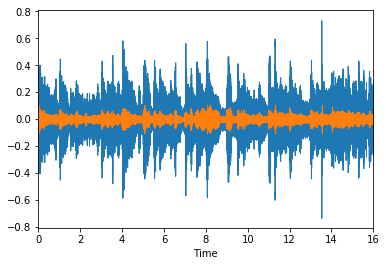

In [7]:
librosa.display.waveplot(y_hat_sign, sr=sr);
librosa.display.waveplot(y_hat2, sr=sr)

In [8]:
noteDict={}
mid = mido.MidiFile('4Beatsslow.mid')
for i, track in enumerate(mid.tracks):
    print('Track {}: {}'.format(i, track.name))
    for msg in track:
        print(msg.time)

Track 0: Inst 1
0
0
0
0
0
0
0
0
240
240
240
240
240
240
240
240


In [9]:
120*24

2880

In [11]:
bps = (60/(60000000/500000))
ticktime = bps/(24)
ticktime*240
print(bps,ticktime,(ticktime*240)/20)

0.5 0.020833333333333332 0.25


In [12]:
for msg in mido.MidiFile('4Beats.mid').play():
    print(msg)

note_on channel=0 note=48 velocity=80 time=0
note_off channel=0 note=48 velocity=64 time=0.25
note_on channel=0 note=48 velocity=80 time=0.25
note_off channel=0 note=48 velocity=64 time=0.25
note_on channel=0 note=48 velocity=80 time=0.25
note_off channel=0 note=48 velocity=64 time=0.25
note_on channel=0 note=48 velocity=80 time=0.25
note_off channel=0 note=48 velocity=64 time=0.25


In [13]:
for msg in mido.MidiFile('4Beatsslow.mid'):
    #time.sleep(msg.time)
    if not msg.is_meta:
        print(msg.note)

48
48
48
48
48
48
48
48


In [14]:
def noteToFreq(m):
    return 2**((m-69)/12) * 440

In [45]:
midiArray=[]
HopSize= 2048 / 22050 / 4
timeTracker=0.0
totalTimeTracker=0.0
MemoryArray=np.zeros(1025)
lasttime=0;
for msg in mido.MidiFile('Dancing.Queen.mid'):
    if not msg.is_meta:
        totalTimeTracker+=msg.time
        nextEventTime=lasttime+msg.time
        while nextEventTime> timeTracker + HopSize:
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize;
        if msg.type=='note_on':
            MemoryArray[math.floor(noteToFreq(msg.note)/10.864)]+=1.0;
        elif msg.type=='note_off':
            MemoryArray[math.floor(noteToFreq(msg.note)/10.864)]-=1.0;
        if timeTracker+msg.time == timeTracker + HopSize:
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize
        lasttime += msg.time
midiArray = np.array(midiArray)        

In [40]:
midiArray

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [41]:
midifft = np.array(midiArray).T

In [42]:
len(midifft)

1025

In [43]:
midifft.shape

(1025, 8861)

(8861, 1025)


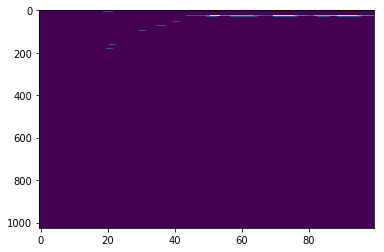

In [44]:
y_hat = librosa.istft(midifft)
npMidiArray=np.array(midiArray)
print(npMidiArray.shape)
plt.imshow(npMidiArray.T[:,100:200],aspect='auto',interpolation='none')

In [46]:
ipd.Audio(y_hat,rate=22050)